### Лабораторная 1

Выполнила Аделина Макарова гр.221

Варинант 13

Новостной сайт: https://www.1rnd.ru/news/

Задание: Дан граф текста, множество вершин совпадает со словарем текста, связи являются взвешенными и показывают, как часто два слова были синтаксически подчинены третьему слову. Найти слова с наибольшей мерой посредничества. Синтаксический анализ текста провести самостоятельно.

In [ ]:
import re
import time
import os
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from bs4 import BeautifulSoup

ModuleNotFoundError: No module named 'selenium'

In [ ]:
import requests

In [ ]:
import chardet

### Функция для сбора ссылок на новости с сайта

In [ ]:
# На вход ссылка на сайт, число ссылок для обработки, output файл
def get_links(url, number, links_file):

    # Запускаем драйвер для Chrome, чтобы скроллить страницу
    driver_path = '/Users/adelemak/Downloads/chromedriver-mac-arm64/chromedriver'
    chrome_service = Service(driver_path)
    driver = webdriver.Chrome(service=chrome_service)

    driver.get(url)

    # Проверяем наличие файла с ссылками и преобразуем ссылки в сет, чтобы не было дублирования
    # Это сделано, чтобы можно было по частям обрабатывать ссылки, начиная с последней обработанной
    if os.path.exists(links_file):
        with open(links_file, 'r', encoding='utf-8') as f:
            processed_links = set(f.read().splitlines())
    else:
        processed_links = set()

    links = 0  # Счетчик ссылок

    while links < number:
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")  # Прокручиваем страницу
        time.sleep(5)

        # Получаем HTML-код страницы и парсим, находя ссылки
        page_script = driver.page_source
        soup = BeautifulSoup(page_script, 'html.parser')
        news_pieces = soup.find_all('a', {'class': 'c-news-block__title'})

        for piece in news_pieces:
            href = piece.get('href')
            if not href:
                continue
            full_url = f'https://www.1rnd.ru{href}' # Создаем полную ссылку и проверяем, есть ли она в обработанных
            if full_url in processed_links:
                continue
            else:
                with open(links_file, 'a', encoding='utf-8') as p:  # Добавляем полную сслыку в файл и в сет
                    p.write(full_url + "\n")
                    processed_links.add(full_url)
                    links += 1
                if links >= number:
                    break
        if links >= number:
            break
    driver.quit()

    print(f"Данные сохранены в {links_file}")
    return links_file

# Реализация, всего было обрабоотано 5000 ссылок
url = 'https://www.1rnd.ru/news/'
number = 4000
links_file = 'hrefs.txt'
get_links(url, number, links_file)


Данные сохранены в hrefs.txt


'hrefs.txt'

### Функция для получения текстов новостей

In [ ]:
# Удаляем лишние символы из текста
def clean_text(text):
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'(\n\s*)+', '\n', text)
    return text.strip()

def get_texts(links_file, output_file):
    with open(links_file, 'r', encoding='utf-8') as file:
        links = file.read().splitlines()  # Открываем файл и читаем построчно ссылки
        with open(output_file, 'w', encoding='utf-8') as output:  # Открываем выходной файл
            for link in links:
                try:
                    response = requests.get(link)
                    # Определение кодировки
                    detected_encoding = chardet.detect(response.content)['encoding']
                    if not detected_encoding:
                        detected_encoding = 'utf-8'
                    news_soup = BeautifulSoup(response.content, 'html.parser', from_encoding=detected_encoding)

                    # Удаляем подпись к фото из текста
                    for extra in news_soup.find_all('div', {'class': 'article-details__poster-container'}):
                        extra.decompose()

                    # Находим блоки текста в новости
                    text_blocks = news_soup.find_all('div', {'class': 'article-details__text'})
                    news_text = ""
                    for block in text_blocks:
                        text = block.get_text(separator="\n")
                        if text:
                            news_text += text.strip() + "\n"  # Записываем блок новости в переменную

                    if news_text:
                        cleaned_text = clean_text(news_text)  # Очищаем текст
                        output.write(cleaned_text + "\n\n")  # Кладем в файл
                        print(f"Сохранен текст новости с {link}")

                except Exception as e:
                    print(f"Ошибка при обработке ссылки {link}: {e}")

    print(f"Все тексты новостей сохранены в {output_file}")
    return output_file

links_file = 'hrefs.txt'
output_file = 'news_texts1.txt'
get_texts(links_file, output_file)

Сохранен текст новости с https://www.1rnd.ru/news/obshchestvo/v-rostove-ogranichat-dvizhenie-po-budyennovskomu/
Сохранен текст новости с https://www.1rnd.ru/news/obshchestvo/v-rostove-komande-i-patsientam-okdts-predstavili-novogo-spetsialista/?erid=LjN8KAR4M
Сохранен текст новости с https://www.1rnd.ru/news/proisshestviya/v-rostovskoy-oblasti-nachalas-zasukha/
Сохранен текст новости с https://www.1rnd.ru/news/proisshestviya/v-rostovskoy-oblasti-devochka-pogibla-ot-udara-tokom-v-dushe/
Сохранен текст новости с https://www.1rnd.ru/news/proisshestviya/v-rostovskoy-oblasti-vozdukh-raskalitsya-do-38-v-nachale-nedeli/
Сохранен текст новости с https://www.1rnd.ru/news/proisshestviya/pyat-chelovek-postradali-pri-perevorote-mashiny-v-rostovskoy-oblasti/
Сохранен текст новости с https://www.1rnd.ru/news/obshchestvo/na-trassakh-rostovskoy-oblasti-postavyat-eshchye-20-dorozhnykh-kamer/
Сохранен текст новости с https://www.1rnd.ru/news/proisshestviya/v-taganrogskom-zalive-spasli-dvukh-unesyennykh-v

'news_texts1.txt'

### Построение графа

In [2]:
import spacy
import networkx as nx
from collections import defaultdict
import matplotlib.pyplot as plt

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -U spacy
!python -m spacy download ru_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 39.4 MB/s eta 0:00:00
  Attempting uninstall: spacy
    Found existing installation: spacy 3.7.4
    Uninstalling spacy-3.7.4:
      Successfully uninstalled spacy-3.7.4


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 53.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('ru_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [3]:
# Загрузка модели spaCy для русского языка
nlp = spacy.load("ru_core_news_sm")

In [6]:
def build_graph_from_texts(texts):
    # Создаем граф
    graph = nx.Graph()

    # Словарь с подсчетом синтаксических связей
    dependency_counter = defaultdict()

    for text in texts:
        # Синтаксический разбор
        doc = nlp(text)
        for token in doc:
            # Пропускаем числа, аббревиатуры и стоп-слова
            if (token.dep_ != "ROOT" and not token.is_digit and token.is_alpha
                and not token.text.isupper() and not token.is_stop):
                # Находим головной токен
                head = token.head
                # Ищем его детей, которые не являются текущим токеном
                for child in head.children:
                    if (child != token and not child.is_digit and child.is_alpha
                        and not child.text.isupper() and not child.is_stop):
                        lemma_token = token.lemma_  # Лемматизируем
                        lemma_child = child.lemma_

                        # Делаем frozenset чтобы пары в другом порядке не повторялись
                        pair = frozenset([lemma_token, lemma_child])
                        # Добавляем в словарь-счетчик
                        if pair not in dependency_counter:
                            dependency_counter[(pair)] = 0

                        # Увеличиваем счетчик
                        dependency_counter[pair] += 1

    # Добавляем данные в граф: вес ребер - счетчик, веришны - слова
    for word_pair, count in dependency_counter.items():
        if len(word_pair) == 2:
            word1, word2 = tuple(word_pair)  # Преобразование frozenset в кортеж для распаковки
            graph.add_edge(word1, word2, weight=count)

    return graph


# Функция для визуализации графа
def visualize_graph(graph):

    plt.figure(figsize=(30, 30))

    # Организцем узлы по Force-Directed Layout
    pos = nx.spring_layout(graph, k=0.1, iterations=50)

    nx.draw(graph, pos, with_labels=True, node_size=20, node_color='red', font_size=8, font_weight='normal', edge_color='gray')

    plt.show()


# Основная функция
def main(txt_file):
    # Чтение данных из TXT-файла
    with open(txt_file, 'r', encoding='utf-8') as file:
        texts = file.read().split('\n\n')
        texts_1 = [text for text in texts if text.strip()] # Проверяем, что строка не пустая

    # Построение графа на основе всех текстов
    graph = build_graph_from_texts(texts_1)

    # Визуализация графа
    visualize_graph(graph)

    return graph


In [5]:
file_path = "/content/drive/My Drive/news_texts1.txt"

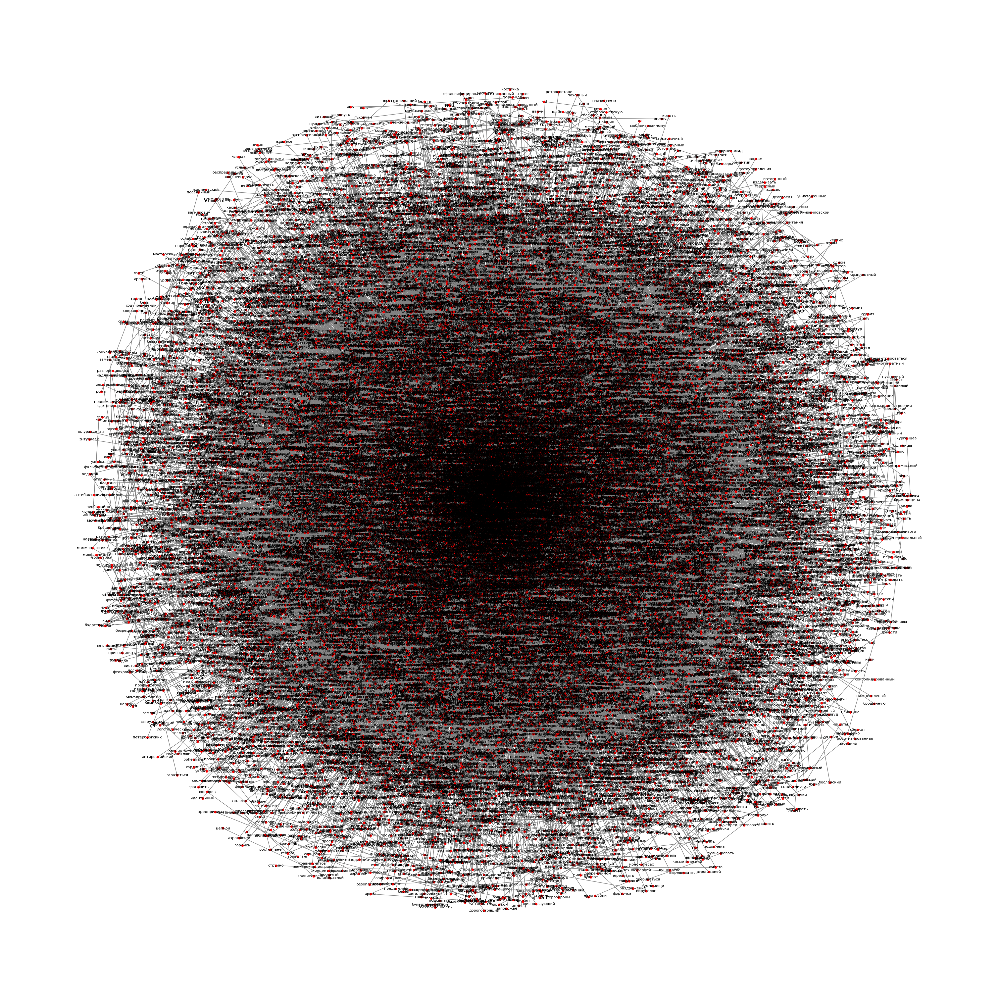

In [7]:
news_graph = main(file_path)

In [8]:
number_nodes = news_graph.number_of_nodes()
print(f"Количество узлов в графе: {number_nodes}")

Количество узлов в графе: 23127


In [9]:
# Ищем топ 50 слов с наибольшей мерой посредничества
def betweenness_centrality(graph, top_n=50):
    betweenness = nx.betweenness_centrality(graph, weight='weight')
    sorted_betweenness = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)
    return sorted_betweenness[:top_n]

In [ ]:
from tqdm import tqdm

def n_betweenness_centrality(graph, top_n=50):
    # Получение всех узлов графа
    nodes = list(graph.nodes())
    # Инициализация прогресс-бара
    pbar = tqdm(total=len(nodes), desc="Calculating betweenness centrality")

    # Вычисление меры посредничества с прогрессом
    betweenness = {}
    for node in nodes:
        betweenness[node] = nx.betweenness_centrality_subset(graph, sources=[node], targets=nodes, weight='weight')[node]
        pbar.update(1)

    pbar.close()
    # Сортировка узлов по мере посредничества
    sorted_betweenness = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)
    return sorted_betweenness[:top_n]


In [10]:
# Нахождение слов с наибольшей мерой посредничества
top_betweenness = betweenness_centrality(news_graph, top_n=50)
for word, centrality in top_betweenness:
    print(f"Слово: {word}, Betweenness Centrality: {centrality}")

Слово: год, Betweenness Centrality: 0.0426902132166544
Слово: ростов, Betweenness Centrality: 0.036273046477538186
Слово: область, Betweenness Centrality: 0.025558283921938766
Слово: рассказать, Betweenness Centrality: 0.021388136971750068
Слово: человек, Betweenness Centrality: 0.018767853845558485
Слово: новый, Betweenness Centrality: 0.017572914628816234
Слово: район, Betweenness Centrality: 0.01722527258749225
Слово: место, Betweenness Centrality: 0.017077474857373594
Слово: время, Betweenness Centrality: 0.01701588123834294
Слово: слово, Betweenness Centrality: 0.016787099603708958
Слово: день, Betweenness Centrality: 0.014137256854505221
Слово: город, Betweenness Centrality: 0.013301600058503761
Слово: работа, Betweenness Centrality: 0.012663469781770785
Слово: рубль, Betweenness Centrality: 0.01239393665499764
Слово: ребёнок, Betweenness Centrality: 0.012163020360127046
Слово: информация, Betweenness Centrality: 0.011428222725444939
Слово: центр, Betweenness Centrality: 0.011358